In [3]:
import os
import torch
from torch import nn,optim
import torch.nn.functional as F
from torch.utils.data import DataLoader,Dataset,random_split
from torchsummary import summary
from PIL import Image
import matplotlib.pyplot as plt
from xml.etree import ElementTree as ET
import numpy as np
from torchvision import transforms
from skimage import io
from tqdm.auto import tqdm
import torchvision.transforms.functional as TF
from mpl_toolkits.axes_grid1 import ImageGrid

In [4]:
class FaceLandmarksAugmentation:
    def __init__(self, image_dim, brightness, contrast, saturation, hue, face_offset, crop_offset, rotation_limit):
        # Initialization parameters
        self.image_dim = image_dim            #Target dimension for the image.
        self.face_offset = face_offset        #Padding around the detected face during cropping.
        self.crop_offset = crop_offset        #Additional resizing offset.
        self.rotation_limit = rotation_limit  #Maximum rotation angle for random rotation.

        '''Initializes a color jitter transformation using transforms.ColorJitter to adjust the brightness, contrast,
        saturation, and hue of the image.'''

        self.transform = transforms.ColorJitter(brightness, contrast, saturation, hue)

    def offset_crop(self, image, landmarks, crops_coordinates):

        ''' This method crops the image based on given facial crop coordinates (crops_coordinates),
        modifies the facial landmarks accordingly, and resizes the image.'''


        '''Extracts the left, top, width, and height values from crops_coordinates,
        adding or subtracting face_offset to include padding around the face.'''

        left = int(crops_coordinates['left']) - self.face_offset
        top = int(crops_coordinates['top']) - self.face_offset
        width = int(crops_coordinates['width']) + (2 * self.face_offset)
        height = int(crops_coordinates['height']) + (2 * self.face_offset)

        image = TF.crop(image, top, left, height, width)
        landmarks = landmarks - np.array([[left, top]])  #making the landmarks relative to this new cropped image's coordinate system.

        # Adjusting the dimension of the cropped image
        new_dim = self.image_dim + self.crop_offset
        image = TF.resize(image, (new_dim, new_dim))

        # Scaling landmarks according to the new dimensions
        #This adjustment is necessary to maintain the correct placement of landmarks after the image has been resized from its original dimensions.
        landmarks[:, 0] *= new_dim / width
        landmarks[:, 1] *= new_dim / height

        return image, landmarks

    def random_face_crop(self, image, landmarks):
        # Converting the image to a NumPy array for manipulation
        image = np.array(image)

        # Get the height and width of the image
        h, w = image.shape[:2]

        # Randomly selecting the top-left corner for the crop,Ensuring the crop is within the limit
        top = np.random.randint(0, h - self.image_dim)
        left = np.random.randint(0, w - self.image_dim)

        # Cropping the image
        image = image[top: top + self.image_dim, left: left + self.image_dim]
        landmarks = landmarks - np.array([[left, top]])

        # Returning as PIL image and updated landmarks
        return TF.to_pil_image(image), landmarks

    def random_rotation(self, image, landmarks):
        # Generating a random rotation angle
        angle = np.random.uniform(-self.rotation_limit, self.rotation_limit)

        # Creating a rotation transformation matrix
        landmarks_transformation = np.array([
            [+np.cos(np.radians(angle)), -np.sin(np.radians(angle))],
            [+np.sin(np.radians(angle)), +np.cos(np.radians(angle))]
        ])

        # Rotating the image by the generated angle
        image = TF.rotate(image, angle)

        # Transforming landmarks by the rotation matrix
        '''Assuming the landmark coordinates are normalized (i.e., they range from 0 to 1),
        subtracting 0.5 will change the coordinate system to be centered around (0.5, 0.5), which is the center of the image in normalized coordinates.'''

        landmarks = landmarks - 0.5  #This adjusts the landmarks by shifting them so that the origin (0, 0) is at the center of the coordinate system. This is done to apply the rotation around the center of the landmarks.
        transformed_landmarks = np.matmul(landmarks, landmarks_transformation)
        transformed_landmarks = transformed_landmarks + 0.5  # Re-centering after transformation

        return image, transformed_landmarks

    def __call__(self, image, landmarks, crops_coordinates):
        # Apply offset cropping first
        image, landmarks = self.offset_crop(image, landmarks, crops_coordinates)

        # Apply random cropping after offset cropping
        image, landmarks = self.random_face_crop(image, landmarks)

        # Apply random rotation on the cropped image and landmarks
        image, landmarks = self.random_rotation(image, landmarks)

        # Apply color jitter transformation
        return self.transform(image), landmarks

In [5]:
class Preprocessor:
    def __init__(self,
                 image_dim,
                 brightness,
                 contrast,
                 saturation,
                 hue,
                 rotation_limit,
                 face_offset,
                 crop_offset):

        self.image_dim = image_dim

        # Initialize the combined FaceLandmarksAugmentation class

        self.face_landmarks_augmentation = FaceLandmarksAugmentation(
            image_dim=image_dim,
            brightness=brightness,
            contrast=contrast,
            saturation=saturation,
            hue=hue,
            face_offset=face_offset,
            crop_offset=crop_offset,
            rotation_limit=rotation_limit
        )

    def __call__(self, image, landmarks, crops_coordinates):
        # Convert image to PIL if it's in NumPy format
        image = TF.to_pil_image(image)

        # Perform the full augmentation (face cropping, random cropping, random rotation, color jitter)
        image, landmarks = self.face_landmarks_augmentation.offset_crop(image, landmarks, crops_coordinates)
        image, landmarks = self.face_landmarks_augmentation.random_face_crop(image, landmarks)


        # Normalize landmarks by the image size (scaling them to be relative to the image dimensions)
        landmarks = landmarks / np.array([*image.size])
        image, landmarks = self.face_landmarks_augmentation.random_rotation(image, landmarks)

        # Convert the image to grayscale
        image = TF.to_grayscale(image)

        # Convert the image to a tensor
        image = TF.to_tensor(image)

        # Normalize the image to the range [-1, 1]
        image = (image - image.min()) / (image.max() - image.min())  # Normalize to [0, 1]
        image = (2 * image) - 1  # Scale to [-1, 1],This is a common practice in deep learning to center the data around zero and improve model performance.


        return image, torch.FloatTensor(landmarks.reshape(-1) - 0.5)   #shifts the coordinates to be centered around zero. This adjustment ensures that landmarks are in the range [-0.5, 0.5], which can help with model convergence.


In [6]:
class datasetlandmark(Dataset):
  def __init__(self,Preprocessor,train):
     self.rootdir= r'C:\Users\siddh\OneDrive\Desktop\facial main\ibug_300W_large_face_landmark_dataset'
     self.imagepath=[]
     self.landmarks=[]
     self.crops_coordinates=[]
     self.preprocessor=Preprocessor
     self.train=train

     '''Parsing the xml tree to extract the data from the dataset'''

     tree=ET.parse(os.path.join(self.rootdir,f'labels_ibug_300W_{"train" if train else "test"}.xml'))
     root=tree.getroot()
     for child in root[2]:
       self.imagepath.append(os.path.join(self.rootdir,child.attrib['file']))
       self.crops_coordinates.append(child[0].attrib)
       landmark=[]
       for i in range(68):
          x_coordinate=int(child[0][i].attrib['x'])
          y_coordinate=int(child[0][i].attrib['y'])
          landmark.append([x_coordinate,y_coordinate])
       self.landmarks.append(landmark)
     self.landmarks=np.array(self.landmarks).astype('float32')

  def __len__(self):
    return len(self.imagepath)

  def __getitem__(self,index):
    image=io.imread(self.imagepath[index],as_gray=False)
    landmarks=self.landmarks[index]
    crops_coordinates=self.crops_coordinates[index]

    image,landmarks=self.preprocessor(image,landmarks,crops_coordinates)

    return image,landmarks

In [7]:
def imageshowing(image,landmarks):
  plt.figure(figsize=(5,5))
  image=(image-image.min())/(image.max()-image.min())  #Normalizes the image to have pixel values in the range [0, 1].
  landmarks=landmarks.view(-1,2)
  landmarks =(landmarks+0.5)*preprocessor.image_dim  #The landmarks were previously normalized to be in the range [-0.5, 0.5] in the preprocessing step. Adding 0.5 brings them to the range [0, 1].
  plt.imshow(image[0],cmap='gray')
  plt.scatter(landmarks[:,0],landmarks[:,1],s=20,c='dodgerblue')  #Plots the landmarks on top of the image using plt.scatter().
  plt.axis('off')
  plt.show()

In [10]:
preprocessor=Preprocessor(
                 image_dim=128,
                 brightness=0.24,
                 contrast=0.15,
                 saturation=0.3,
                 hue=0.1,
                 rotation_limit=14,
                 face_offset=32,
                 crop_offset=16)
trainimages=datasetlandmark(preprocessor,train=True)
testimages=datasetlandmark(preprocessor,train=False)

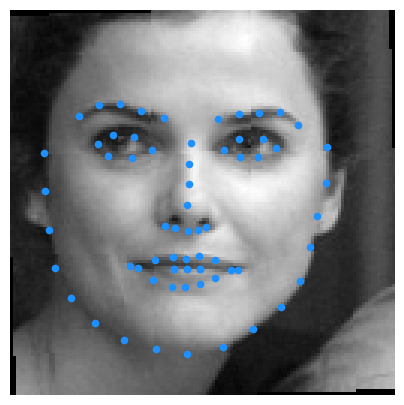

In [16]:
image1,landmarks1=trainimages[16]
imageshowing(image1,landmarks1)

In [12]:
total_images = len(trainimages)
lenval =int(0.1*total_images)
lentrain=total_images-lenval
print(f'{lentrain} images for training and {lenval} images for validation')
print(f'{len(testimages)} images for the testing')

6000 images for training and 666 images for validation
1008 images for the testing


In [13]:
## Split the training dataset into training and validation sets
trainimages,valimages=random_split(trainimages,[lentrain,lenval])
# Set the batch size
batchsize=32
# Create DataLoader objects for training, validation, and testing datasets
train_data=DataLoader(trainimages,batchsize,True)
val_data=DataLoader(valimages,2*batchsize,False)
test_data=DataLoader(testimages,2*batchsize,False)

# Function to visualize a batch of images along with their landmarks

def visiualizebatch(imageslist,landmarkslist,size=14,shape=(4,4)):
 
 # Create a figure with a specified size
  fig=plt.figure(figsize=(size,size))
  # Create a grid layout for the images (4x4 by default)
  grid=ImageGrid(fig,111,nrows_ncols=shape,axes_pad=0.08)
  # Loop over grid, images, and corresponding landmarks
  for i,image,landmarks in zip(grid,imageslist,landmarkslist):
    
    # Normalize the image to the range [0, 1]
    image=(image-image.min())/(image.max()-image.min())
    # Reshape landmarks and adjust to image dimensions
    landmarks=landmarks.view(-1,2)
    landmarks =(landmarks+0.5)*preprocessor.image_dim
    landmarks=landmarks.numpy().tolist()
    landmarks=np.array([(x,y) for (x,y) in landmarks if 0<=x<=preprocessor.image_dim and 0<=y<=preprocessor.image_dim])
    # Plot the image and its landmarks
    i.imshow(image[0],cmap='gray')
    i.scatter(landmarks[:,0],landmarks[:,1],s=10,c='dodgerblue')
    i.axis('off')
  plt.show()

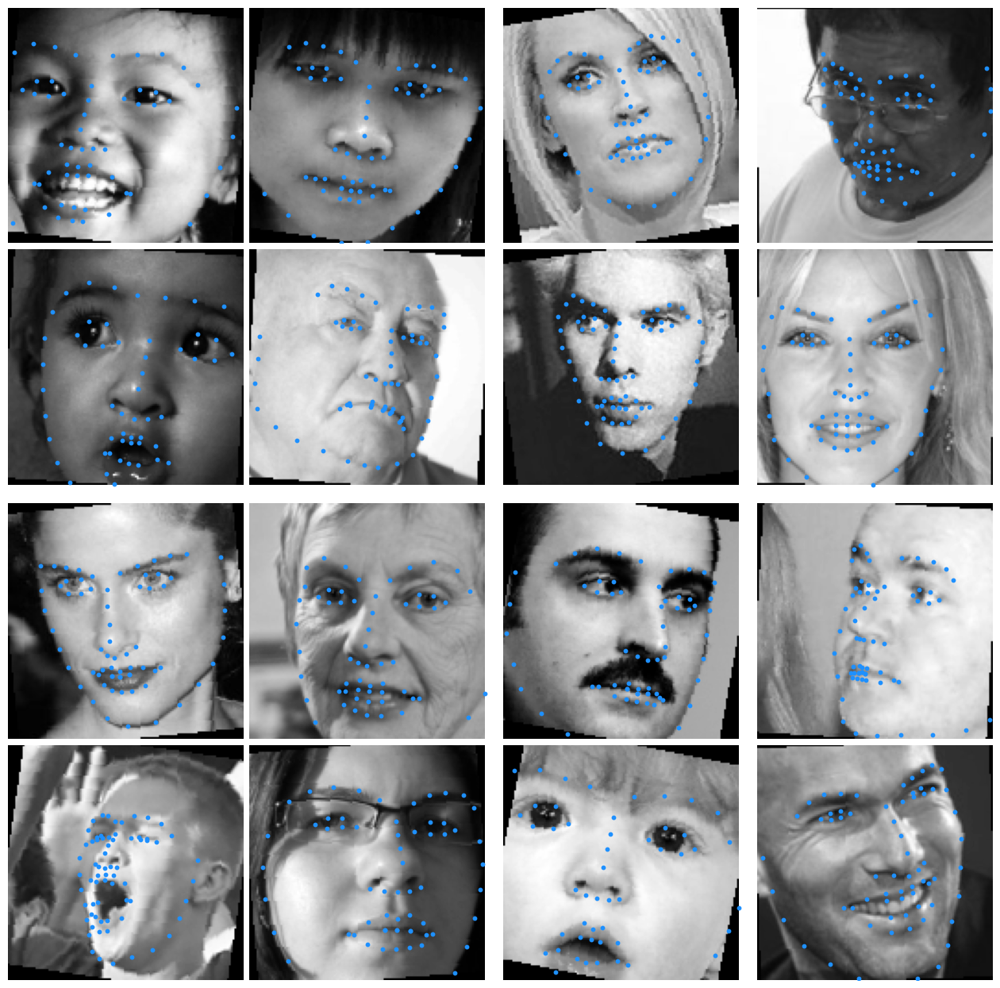

In [15]:
for x,y in train_data:
  break
visiualizebatch(x[:16],y[:16],shape=(4,4),size=16)

In [17]:
class depthwiseseperableconv2d(nn.Module):
  def __init__(self,input_channels,output_channels,kernel_size,**kwargs):
    super(depthwiseseperableconv2d,self).__init__()


# Depthwise convolution: Applies a separate convolutional filter to each input channel
# 'groups=input_channels' means each channel is convolved independently (depthwise).
    self.depthwise=nn.Conv2d(input_channels,input_channels,kernel_size,groups=input_channels,bias=False,**kwargs)

# Pointwise convolution: Combines the output of the depthwise layer, 
# by applying a 1x1 convolution to reduce or increase the number of channels.

    self.pointwise=nn.Conv2d(input_channels,output_channels,1,bias=False)


  def forward(self,x):
    x=self.depthwise(x)
    x=self.pointwise(x)
    return x

In [18]:
class entryblock(nn.Module):
  def __init__(self):
    super(entryblock,self).__init__()
# First convolution block: 1 input channel to 32 channels, followed by BatchNorm and LeakyReLU
    self.conv1= nn.Sequential(
        nn.Conv2d(1,32,3,padding=1,bias=False),
        nn.BatchNorm2d(32),
        nn.LeakyReLU(0.2)
    )
# Second convolution block: 32 input channels to 64 channels
    self.conv2=nn.Sequential(
        nn.Conv2d(32,64,3,padding=1,bias=False),
        nn.BatchNorm2d(64),
        nn.LeakyReLU(0.2)
    )
 # Third block (Residual + Direct Path)
    self.conv3_residual=nn.Sequential(
        depthwiseseperableconv2d(64,64,3,padding=1),
        nn.BatchNorm2d(64),
        nn.LeakyReLU(0.2),
        depthwiseseperableconv2d(64,128,3,padding=1),
        nn.BatchNorm2d(128),
        nn.MaxPool2d(3,stride=2,padding=1)
    )

# Direct path: 1x1 convolution to match the output of residual (input 64 channels, output 128 channels), and downsample using stride=2

    self.conv3direct=nn.Sequential(
        nn.Conv2d(64,128,1,stride=2),
        nn.BatchNorm2d(128)
    )
# Fourth block (Residual + Direct Path)
    self.conv4_residual=nn.Sequential(
        depthwiseseperableconv2d(128,128,3,padding=1),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(0.2),
        depthwiseseperableconv2d(128,256,3,padding=1),
        nn.BatchNorm2d(256),
        nn.MaxPool2d(3,stride=2,padding=1)
    )
# Direct path: 1x1 convolution to match the output of residual (input 128 channels, output 256 channels), and downsample using stride=2
    self.conv4direct=nn.Sequential(
        nn.Conv2d(128,256,1,stride=2),
        nn.BatchNorm2d(256)
    )

# Fifth block (Residual + Direct Path)

    self.conv5_residual=nn.Sequential(
        depthwiseseperableconv2d(256,256,3,padding=1),
        nn.BatchNorm2d(256),
        nn.LeakyReLU(0.2),
        depthwiseseperableconv2d(256,728,3,padding=1),
        nn.BatchNorm2d(728),
        nn.MaxPool2d(3,stride=2,padding=1)
    )
    
# Direct path: 1x1 convolution to match the output of residual (input 256 channels, output 728 channels), and downsample using stride=2
    self.conv5direct=nn.Sequential(
        nn.Conv2d(256,728,1,stride=2),
        nn.BatchNorm2d(728)
    )

  def forward(self,x):
    x=self.conv1(x)
    x=self.conv2(x)

    residual=self.conv3_residual(x)
    direct=self.conv3direct(x)
    x=residual+direct

    residual=self.conv4_residual(x)
    direct=self.conv4direct(x)
    x=residual+direct

    residual=self.conv5_residual(x)
    direct=self.conv5direct(x)
    x=residual+direct

    return x

In [19]:
class middleblock(nn.Module):
  def __init__(self):
    super(middleblock,self).__init__()

    self.conv1=nn.Sequential(
        nn.LeakyReLU(0.2),
        depthwiseseperableconv2d(728,728,3,padding=1),
        nn.BatchNorm2d(728),
    )

    self.conv2=nn.Sequential(
        nn.LeakyReLU(0.2),
        depthwiseseperableconv2d(728,728,3,padding=1),
        nn.BatchNorm2d(728),
    )
    self.conv3=nn.Sequential(
        nn.LeakyReLU(0.2),
        depthwiseseperableconv2d(728,728,3,padding=1),
        nn.BatchNorm2d(728),
    )

  def forward(self,x):
    residual=self.conv1(x)
    residual=self.conv2(residual)
    residual=self.conv3(residual)

    return x+residual

In [20]:
class middleiterativeblock(nn.Module):
  def __init__(self,numblocks):
    super(middleiterativeblock,self).__init__()
    ''' By using *, you are unpacking the list created by the list comprehension ([middleblock() for _ in range(numblocks)])
    so that each element of the list is passed as an individual argument to nn.Sequential().'''
    self.block=nn.Sequential(*[middleblock() for _ in range(numblocks)])

  def forward(self,x):
    return self.block(x)

In [21]:
class exitblock(nn.Module):
  def __init__(self):
    super(exitblock,self).__init__()

# Residual path: Depthwise separable convolutions followed by BatchNorm, LeakyReLU, and max pooling
    self.residualconv= nn.Sequential(
        nn.LeakyReLU(0.2),
        depthwiseseperableconv2d(728,728,3,padding=1),
        nn.BatchNorm2d(728),
        nn.LeakyReLU(0.2),
        depthwiseseperableconv2d(728,1024,3,padding=1),
        nn.BatchNorm2d(1024),
        nn.MaxPool2d(3,stride=2,padding=1)
    )

# Direct path: 1x1 convolution to match the number of channels and downsample (stride=2)
    self.direct=nn.Sequential(
        nn.Conv2d(728,1024,1,stride=2),
        nn.BatchNorm2d(1024)
    )
# Convolution block after residual and direct paths are combined
    self.conv=nn.Sequential(
        depthwiseseperableconv2d(1024,1536,3,padding=1),
        nn.BatchNorm2d(1536),
        nn.LeakyReLU(0.2),
        depthwiseseperableconv2d(1536,2048,3,padding=1),
        nn.BatchNorm2d(2048),
        nn.LeakyReLU(0.2),
    )
# Dropout layer for regularization to prevent overfitting    
    self.dropout =nn.Dropout(0.3)

# Global average pooling to reduce each channel to a single value (1x1 output per channel)    
    self.globlavgpool=nn.AdaptiveAvgPool2d((1,1))


  def forward(self,x):
      direct =self.direct(x)
      residual=self.residualconv(x)
      x=residual+direct
      x=self.conv(x)
      x=self.globlavgpool(x)
      x=self.dropout(x)
      return x

In [22]:
class Network(nn.Module):
  def __init__(self,num_of_blocks):
    super(Network,self).__init__()
# Entry block: Initial layers to extract low-level features
    self.entry_block =entryblock()
# Middle block: A stack of `num_of_blocks` residual blocks (iterative layers) for deep feature extraction
    self.middle_block=middleiterativeblock(num_of_blocks)
# Exit block: Final layers to extract high-level features and reduce spatial dimensions    
    self.exit_block=exitblock()

# Linear layer that outputs 136 values (68 keypoint pairs)

    self.fc=nn.Linear(2048,136)

  def forward(self,x):
    x=self.entry_block(x)
    x=self.middle_block(x)
    x=self.exit_block(x)
    x=x.view(x.size(0),-1)
    x=self.fc(x)

    return x

In [23]:
model=Network(8)
model.cuda()

Network(
  (entry_block): entryblock(
    (conv1): Sequential(
      (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (conv2): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (conv3_residual): Sequential(
      (0): depthwiseseperableconv2d(
        (depthwise): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
        (pointwise): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      )
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
      (3): depthwiseseperableconv2d(
        (depthwise

In [24]:
summary(model,(1,128,128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 128, 128]             288
       BatchNorm2d-2         [-1, 32, 128, 128]              64
         LeakyReLU-3         [-1, 32, 128, 128]               0
            Conv2d-4         [-1, 64, 128, 128]          18,432
       BatchNorm2d-5         [-1, 64, 128, 128]             128
         LeakyReLU-6         [-1, 64, 128, 128]               0
            Conv2d-7         [-1, 64, 128, 128]             576
            Conv2d-8         [-1, 64, 128, 128]           4,096
depthwiseseperableconv2d-9         [-1, 64, 128, 128]               0
      BatchNorm2d-10         [-1, 64, 128, 128]             128
        LeakyReLU-11         [-1, 64, 128, 128]               0
           Conv2d-12         [-1, 64, 128, 128]             576
           Conv2d-13        [-1, 128, 128, 128]           8,192
depthwiseseperableconv2d-14      

In [25]:
objective =nn.MSELoss()
optimizer=optim.Adam(model.parameters(),lr=0.00075)
checkpoint_dir = 'checkpoints'
if not os.path.exists(checkpoint_dir):
    os.makedirs(checkpoint_dir)

validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:18<00:00,  1.68s/it]

The loss for the epoch 1: 0.06117201765829867


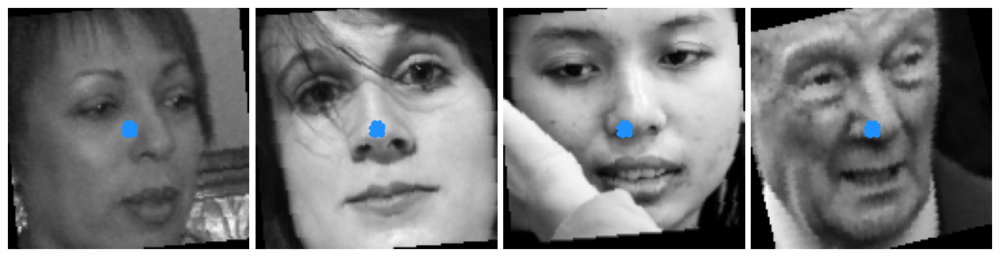

0.06117201765829867

In [26]:
'''
The validate function is used to
 evaluate the performance of model on a validation dataset.'''
@torch.no_grad()
def validate(epoch):
  tloss=0.0
  model.eval()

  for feature,labels in tqdm(val_data,desc='validating',ncols=600):
    feature=feature.cuda()
    labels=labels.cuda()

    output=model(feature)
    loss=objective(output,labels)
  
    tloss+=loss.item()
  print(f"The loss for the epoch {epoch}: {tloss/len(val_data)}")
  visiualizebatch(feature[:4].cpu(),output[:4].cpu(),shape=(1,4),size=16)
  return tloss/len(val_data)


validate(epoch=1)

validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.29s/it]


The loss for the epoch 0: 0.005818251351063902


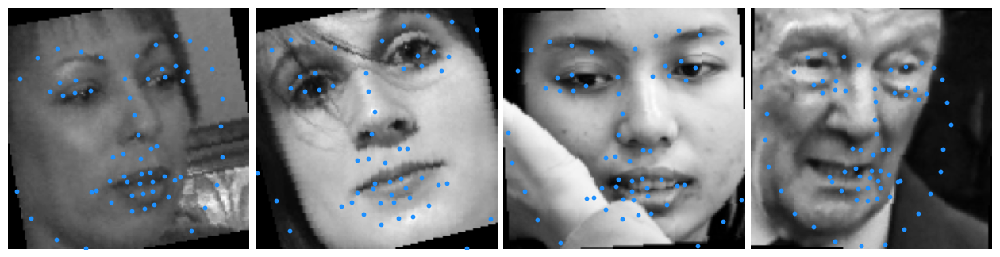

epoch(1/40) -> training Loss:0.01224902 | validation loss:0.00581825


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:40<00:00,  3.67s/it]


The loss for the epoch 1: 0.0021870426029305568


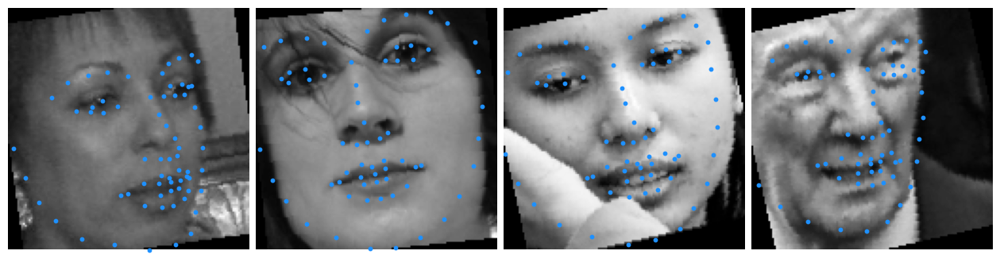

epoch(2/40) -> training Loss:0.00446922 | validation loss:0.00218704


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.29s/it]

The loss for the epoch 2: 0.0020988458577035503


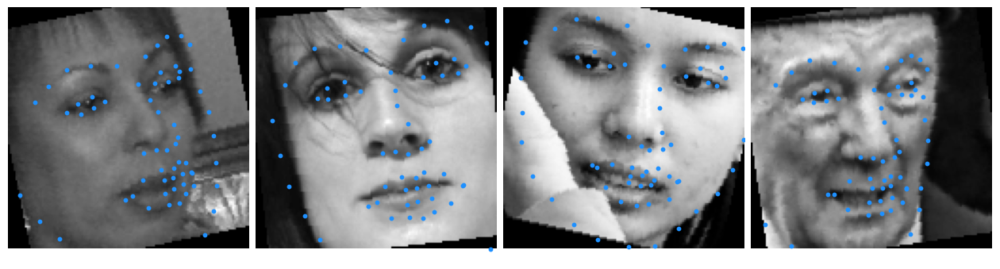

epoch(3/40) -> training Loss:0.00275885 | validation loss:0.00209885


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.30s/it]

The loss for the epoch 3: 0.001490929460322315


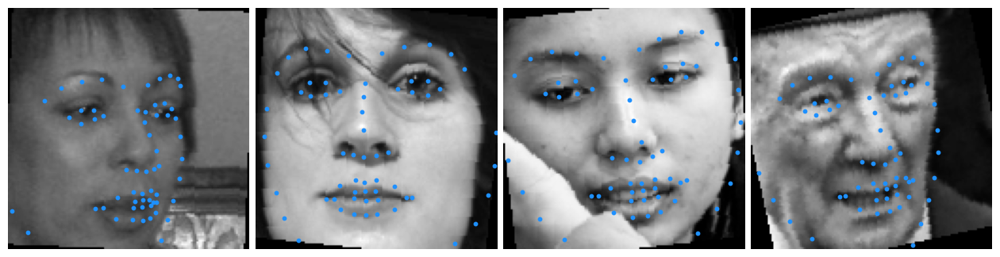

epoch(4/40) -> training Loss:0.00200912 | validation loss:0.00149093


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.28s/it]

The loss for the epoch 4: 0.0011534821030429819


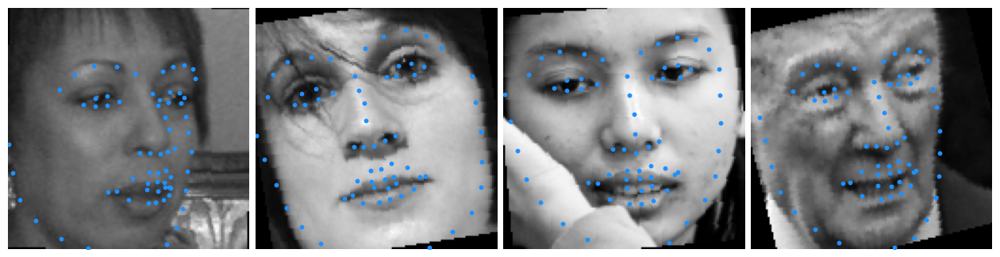

epoch(5/40) -> training Loss:0.00164458 | validation loss:0.00115348


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.29s/it]


The loss for the epoch 5: 0.000850160690871152


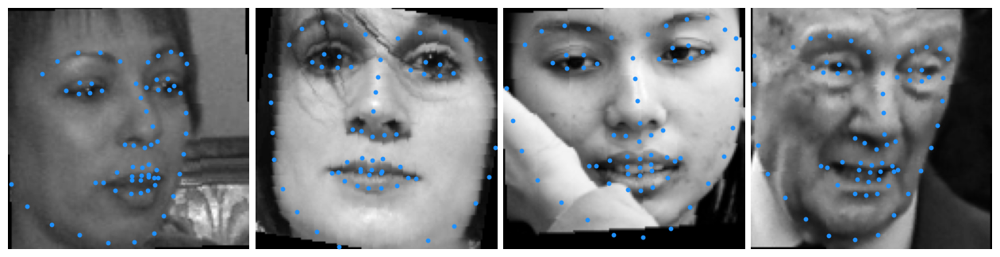

epoch(6/40) -> training Loss:0.00145457 | validation loss:0.00085016


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.30s/it]

The loss for the epoch 6: 0.0016929589381272142


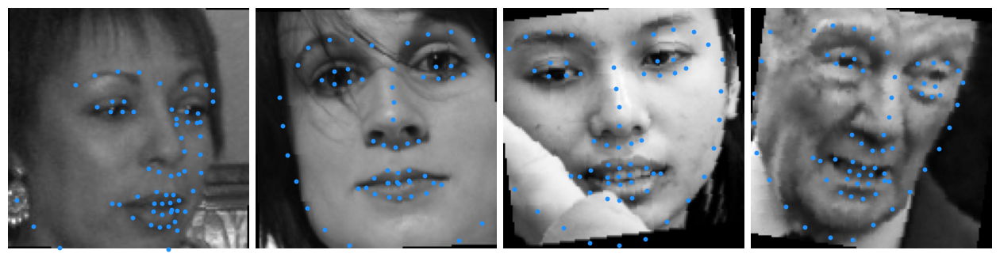

epoch(7/40) -> training Loss:0.00121647 | validation loss:0.00169296


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.29s/it]

The loss for the epoch 7: 0.0008606922241266478


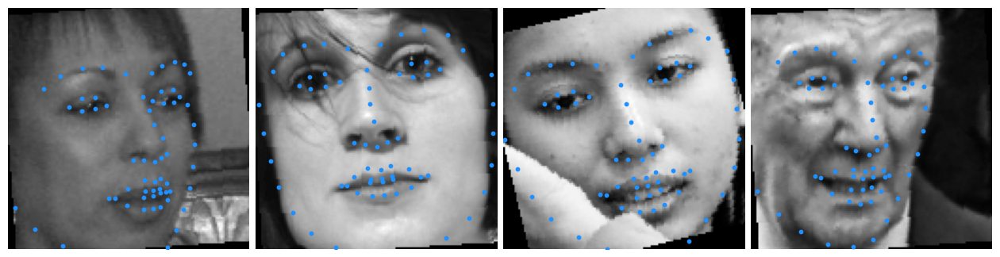

epoch(8/40) -> training Loss:0.00113897 | validation loss:0.00086069


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.30s/it]

The loss for the epoch 8: 0.0013027491301975467


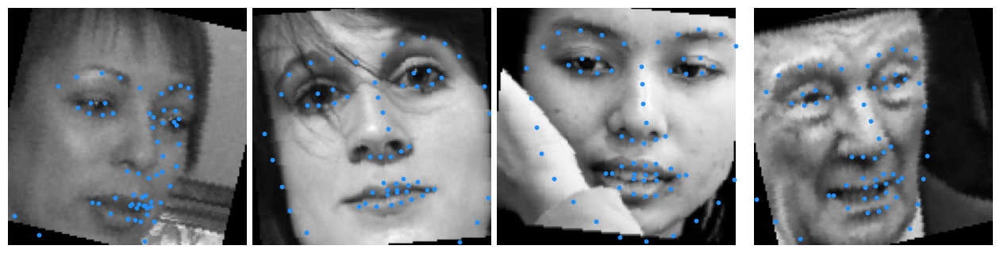

epoch(9/40) -> training Loss:0.00119271 | validation loss:0.00130275


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.30s/it]

The loss for the epoch 9: 0.0007469241443852133


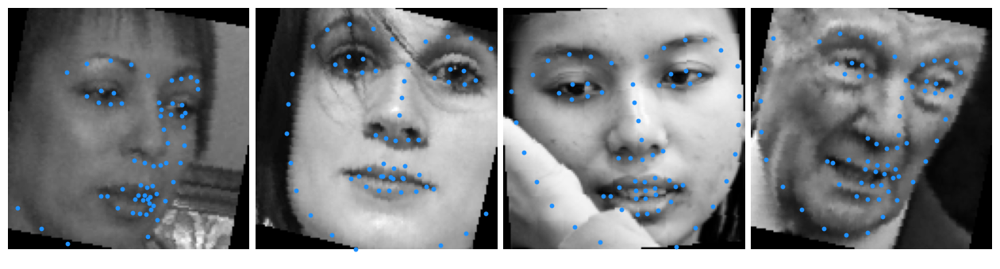

epoch(10/40) -> training Loss:0.00099343 | validation loss:0.00074692


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.31s/it]


The loss for the epoch 10: 0.0015858312835916877


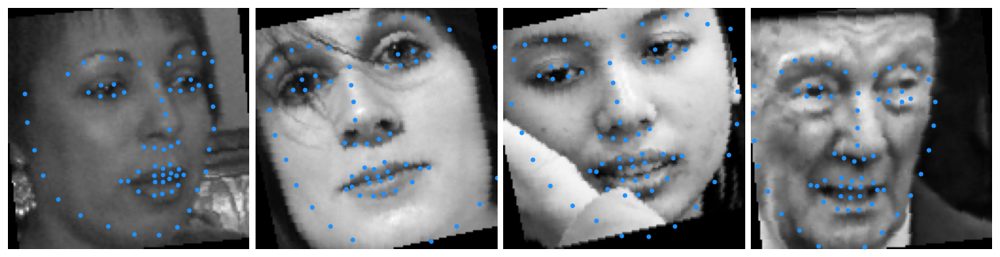

epoch(11/40) -> training Loss:0.00153592 | validation loss:0.00158583


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.30s/it]

The loss for the epoch 11: 0.000900100107008422


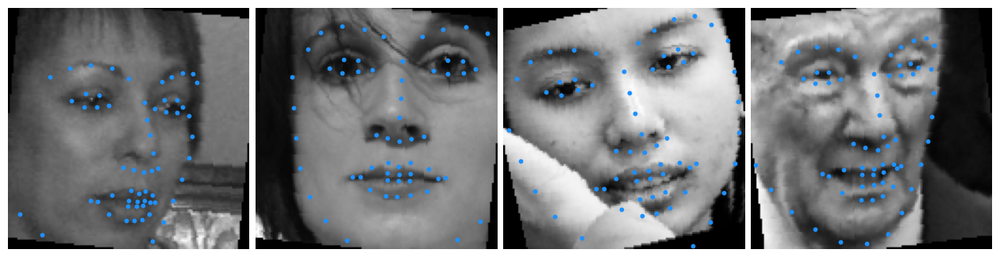

epoch(12/40) -> training Loss:0.00127957 | validation loss:0.00090010


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.30s/it]

The loss for the epoch 12: 0.000790705068290911


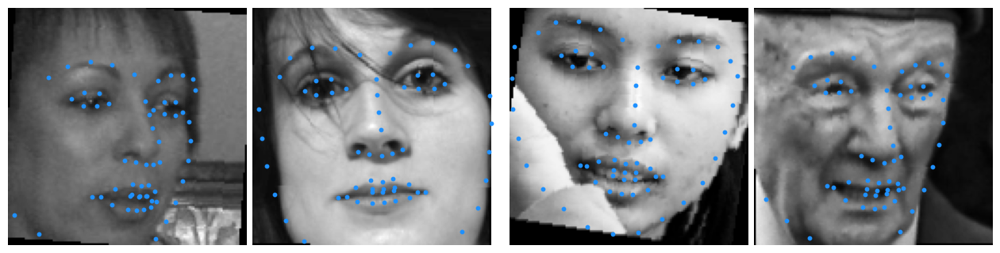

epoch(13/40) -> training Loss:0.00108204 | validation loss:0.00079071


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.30s/it]

The loss for the epoch 13: 0.0009069615361196073


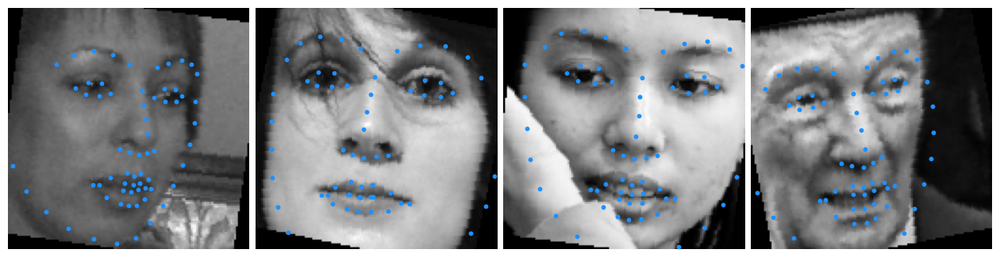

epoch(14/40) -> training Loss:0.00099066 | validation loss:0.00090696


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.30s/it]

The loss for the epoch 14: 0.0008049552032554692


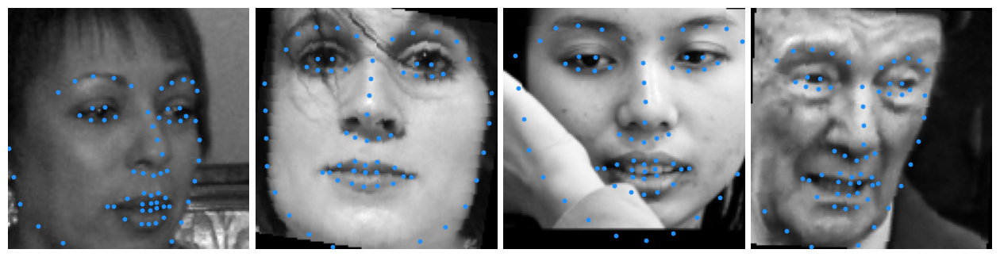

epoch(15/40) -> training Loss:0.00091800 | validation loss:0.00080496


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.29s/it]


The loss for the epoch 15: 0.000994963476180353


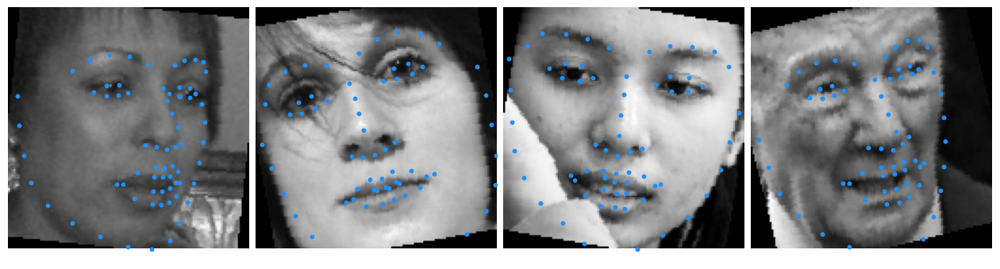

epoch(16/40) -> training Loss:0.00081113 | validation loss:0.00099496


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.31s/it]

The loss for the epoch 16: 0.0007297503709031099


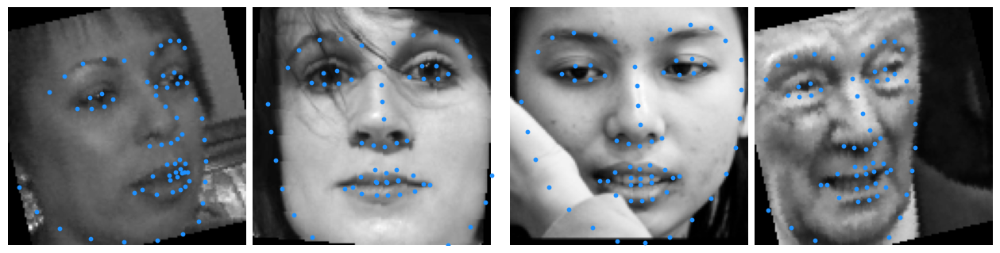

epoch(17/40) -> training Loss:0.00080015 | validation loss:0.00072975


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.31s/it]

The loss for the epoch 17: 0.0006462737113576044


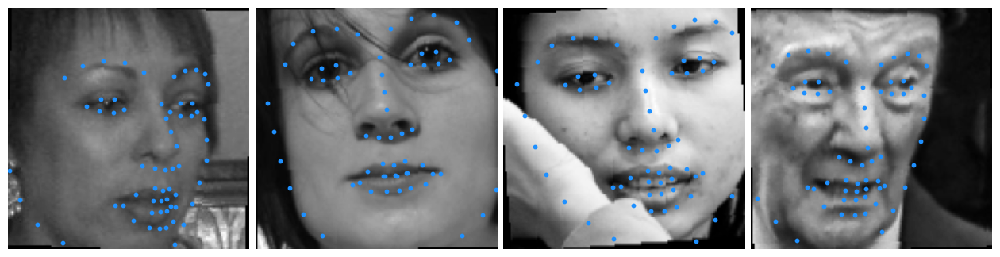

epoch(18/40) -> training Loss:0.00073772 | validation loss:0.00064627


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.31s/it]

The loss for the epoch 18: 0.0008282444323413074


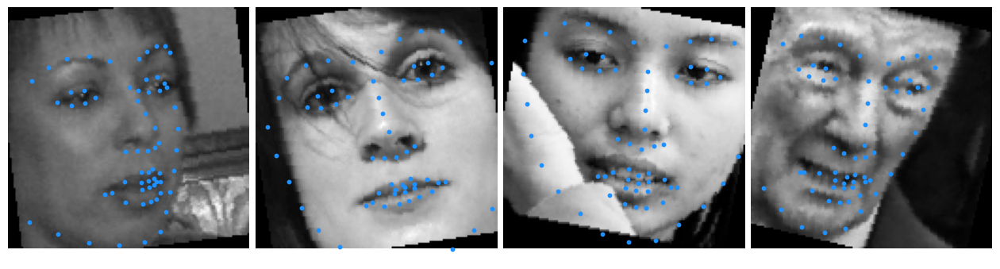

epoch(19/40) -> training Loss:0.00075753 | validation loss:0.00082824


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.30s/it]

The loss for the epoch 19: 0.0007677594972351058


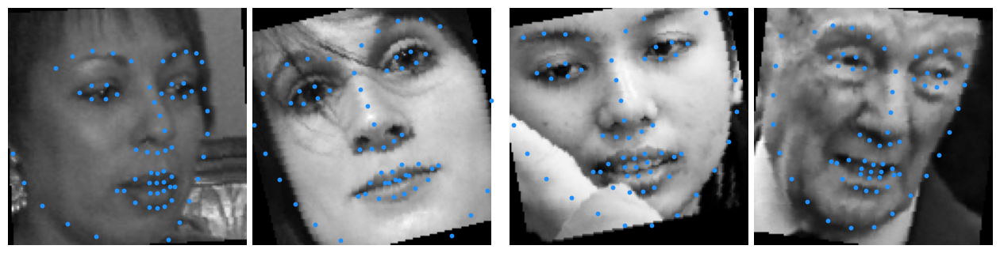

epoch(20/40) -> training Loss:0.00071179 | validation loss:0.00076776


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.31s/it]


The loss for the epoch 20: 0.0007792802061885595


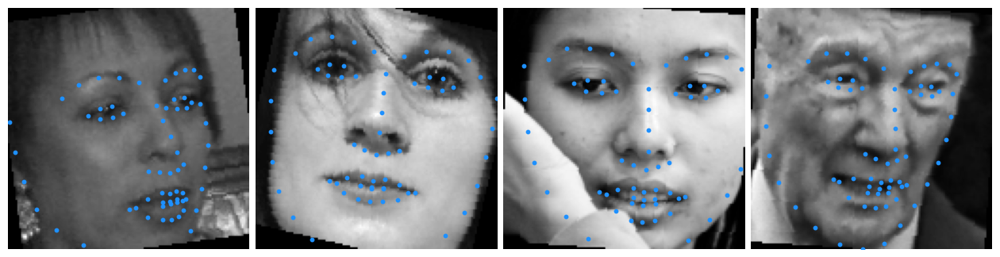

epoch(21/40) -> training Loss:0.00073516 | validation loss:0.00077928


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.32s/it]

The loss for the epoch 21: 0.0006326159293001348


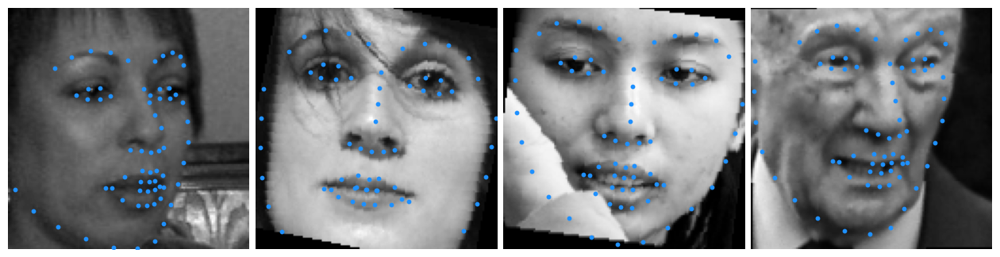

epoch(22/40) -> training Loss:0.00069151 | validation loss:0.00063262


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.31s/it]

The loss for the epoch 22: 0.0005833391756327314


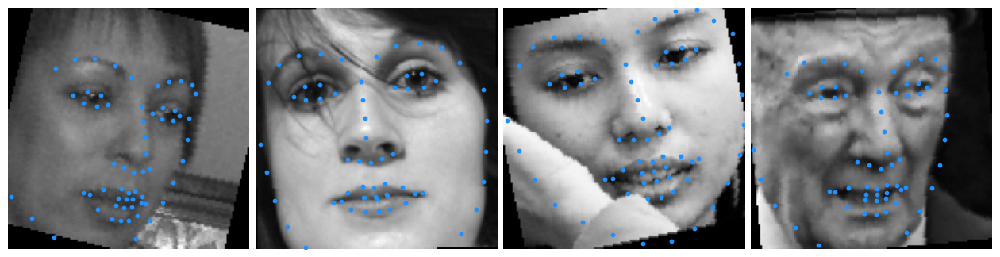

epoch(23/40) -> training Loss:0.00062368 | validation loss:0.00058334


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.32s/it]

The loss for the epoch 23: 0.008639811876822601


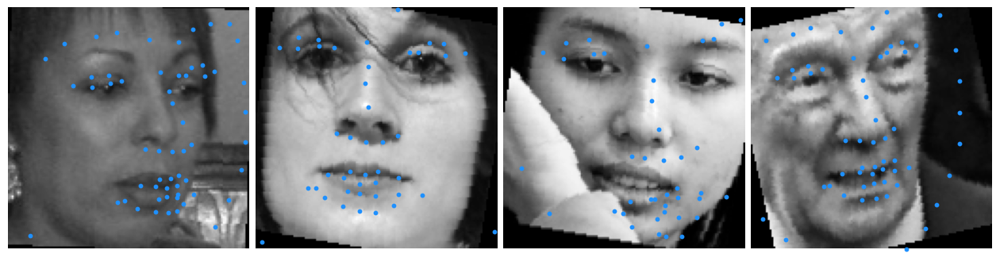

epoch(24/40) -> training Loss:0.00077722 | validation loss:0.00863981


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.32s/it]

The loss for the epoch 24: 0.0009981427574530244


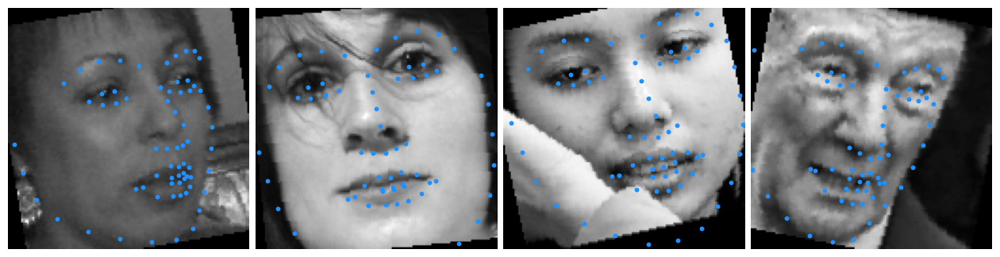

epoch(25/40) -> training Loss:0.00095343 | validation loss:0.00099814


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.30s/it]


The loss for the epoch 25: 0.0005960151743651791


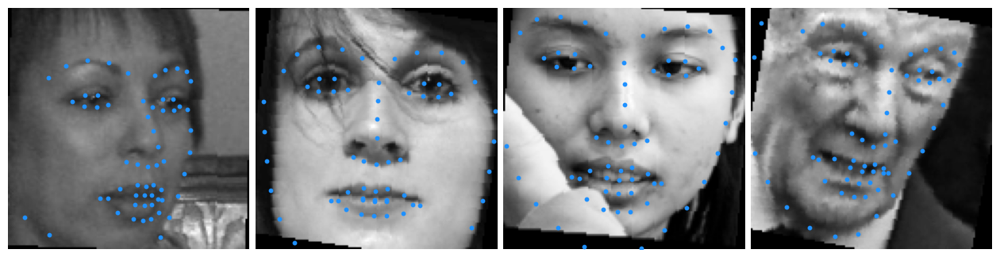

epoch(26/40) -> training Loss:0.00064235 | validation loss:0.00059602


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.31s/it]

The loss for the epoch 26: 0.0006026655742475255


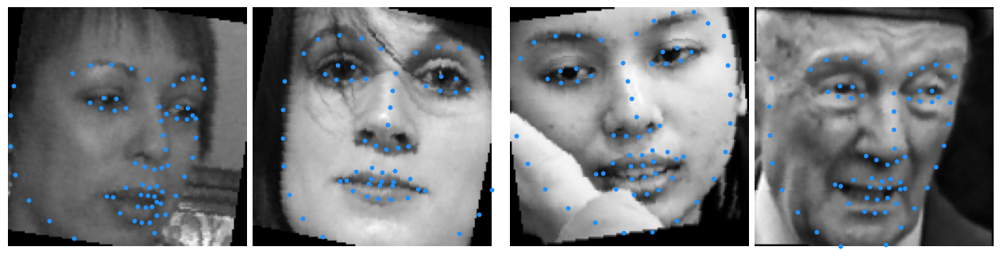

epoch(27/40) -> training Loss:0.00062241 | validation loss:0.00060267


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.31s/it]

The loss for the epoch 27: 0.0005477416059213945


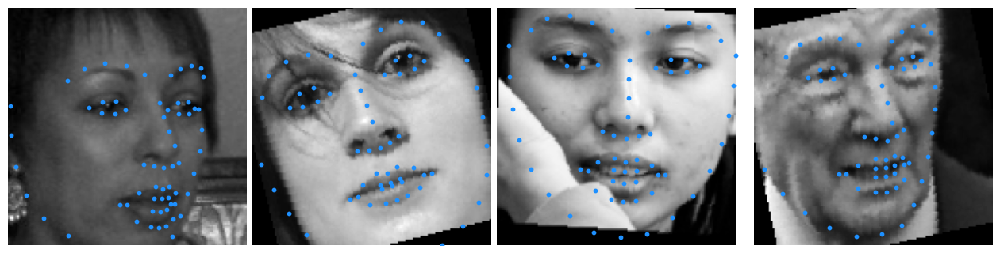

epoch(28/40) -> training Loss:0.00058173 | validation loss:0.00054774


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.32s/it]

The loss for the epoch 28: 0.0005512984167911451


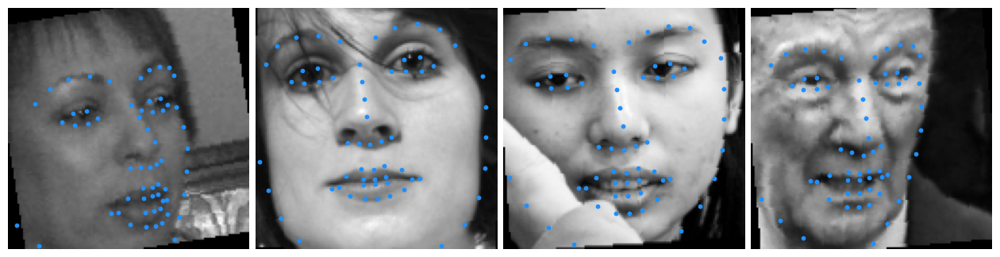

epoch(29/40) -> training Loss:0.00057188 | validation loss:0.00055130


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.32s/it]

The loss for the epoch 29: 0.0005699909895404496


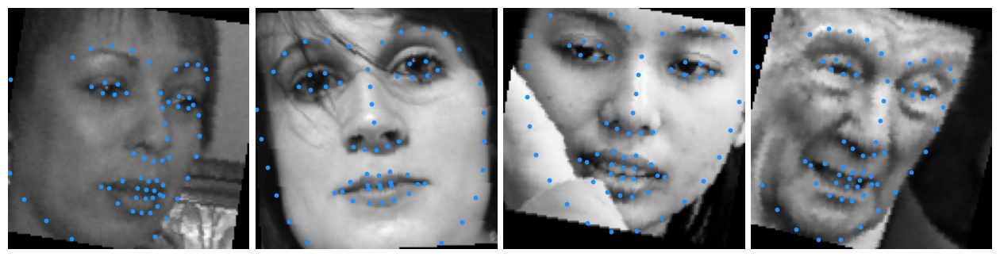

epoch(30/40) -> training Loss:0.00053886 | validation loss:0.00056999


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.31s/it]


The loss for the epoch 30: 0.0006607146642636508


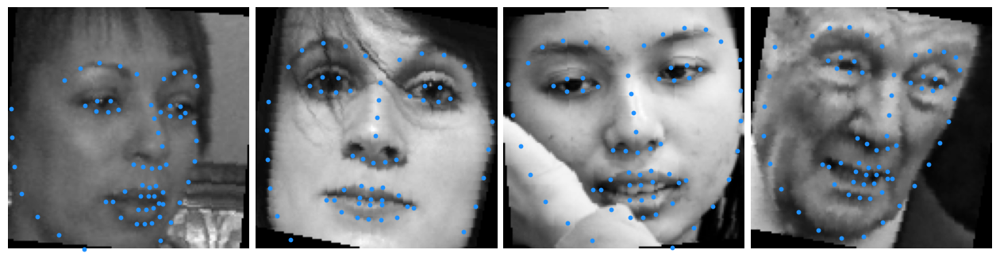

epoch(31/40) -> training Loss:0.00052434 | validation loss:0.00066071


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.31s/it]

The loss for the epoch 31: 0.0005696447042282671


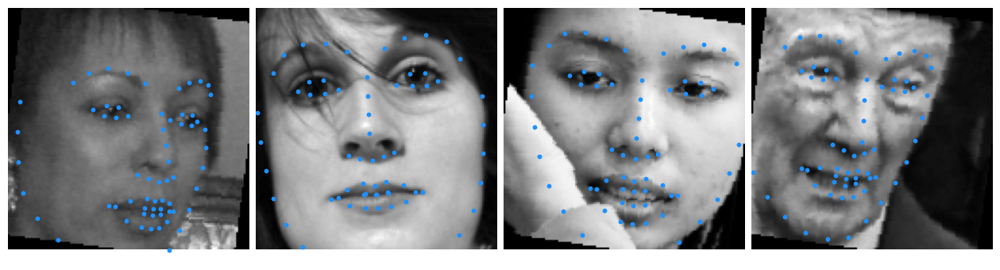

epoch(32/40) -> training Loss:0.00062494 | validation loss:0.00056964


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.32s/it]

The loss for the epoch 32: 0.000629202632064169


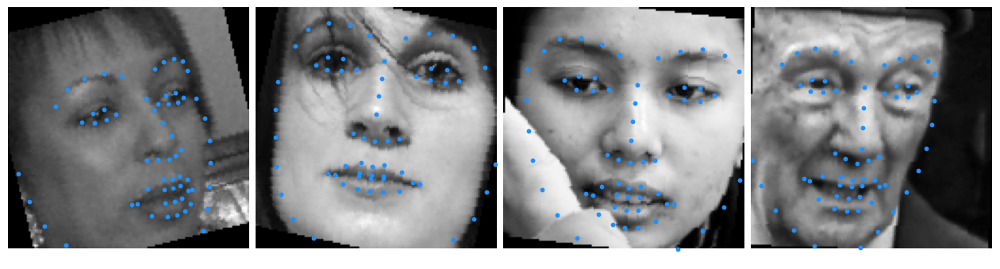

epoch(33/40) -> training Loss:0.00052839 | validation loss:0.00062920


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.33s/it]

The loss for the epoch 33: 0.0005547817854676396


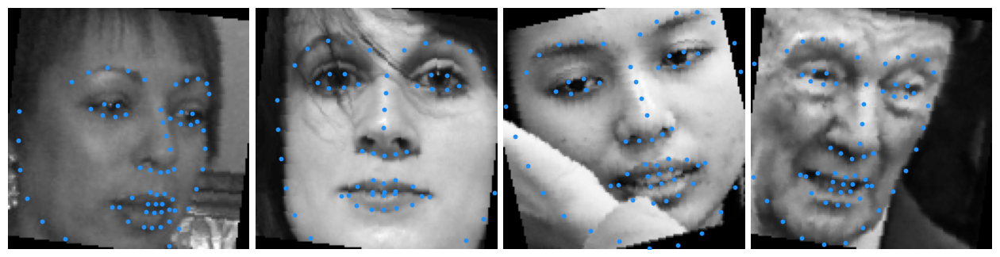

epoch(34/40) -> training Loss:0.00051672 | validation loss:0.00055478


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.32s/it]

The loss for the epoch 34: 0.0005494282707910646


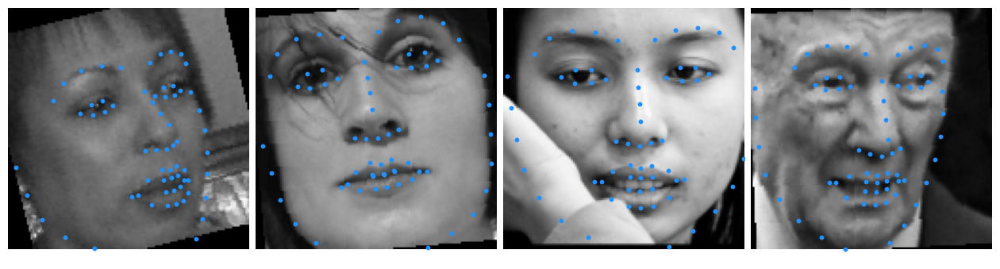

epoch(35/40) -> training Loss:0.00048091 | validation loss:0.00054943


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.32s/it]


The loss for the epoch 35: 0.0005722975289576094


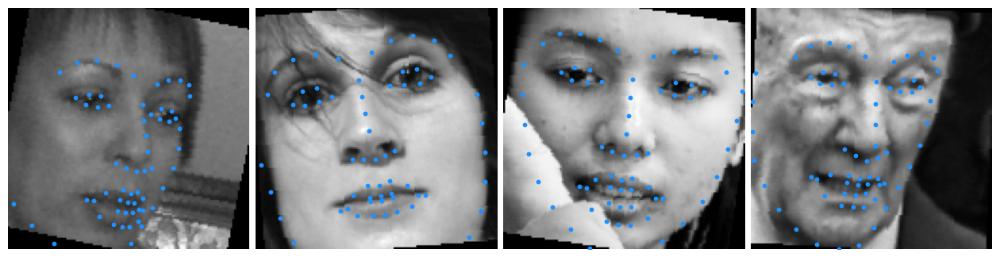

epoch(36/40) -> training Loss:0.00046901 | validation loss:0.00057230


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:35<00:00,  3.26s/it]

The loss for the epoch 36: 0.0004885523415974934


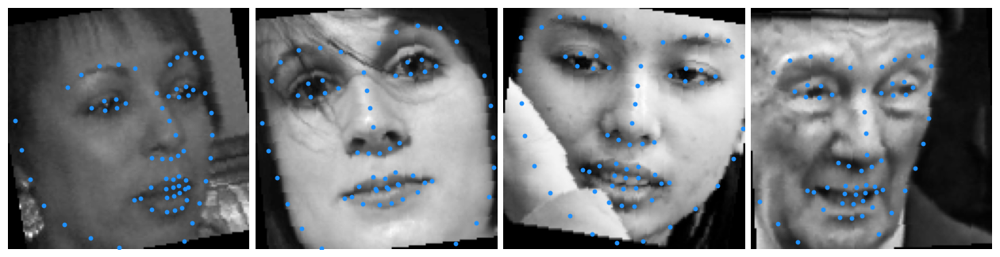

epoch(37/40) -> training Loss:0.00045112 | validation loss:0.00048855


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.30s/it]

The loss for the epoch 37: 0.0005882343393750489


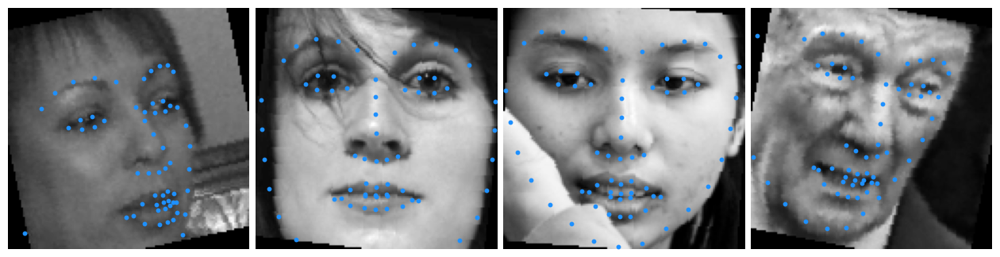

epoch(38/40) -> training Loss:0.00045288 | validation loss:0.00058823


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:35<00:00,  3.22s/it]

The loss for the epoch 38: 0.0004991115975744007


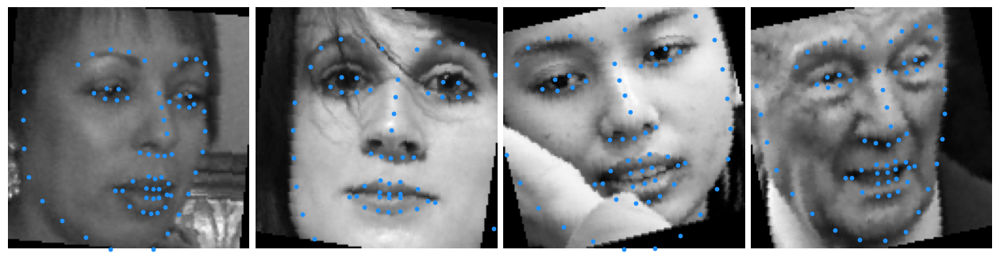

epoch(39/40) -> training Loss:0.00044013 | validation loss:0.00049911


validating: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:35<00:00,  3.25s/it]

The loss for the epoch 39: 0.0005180705021220175


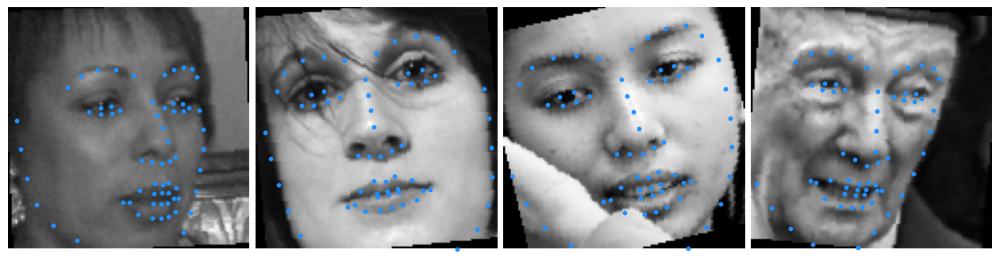

epoch(40/40) -> training Loss:0.00044595 | validation loss:0.00051807


In [27]:
epochs=40
batches=len(train_data)
updatedloss=np.inf

def save_checkpoint(model, optimizer, epoch, path, loss, best=False):
    state = {
        'epoch': epoch,
        'state_dict': model.state_dict(),
        'optimizer': optimizer.state_dict(),
        'loss': loss
    }
    if best:
        torch.save(state, f'checkpoints/best_model.pt')  # Save the best model
    else:
        torch.save(state, f'checkpoints/checkpoint_everyepoch.pt')  # Save at each epoch

for epoch in range(epochs):
  tloss=0.0
  model.train()
  for feature,labels in tqdm(train_data,desc =f'epoch({epoch+1}/{epochs})',ncols=800):
    feature=feature.cuda()
    labels=labels.cuda()

    output=model(feature)
    loss=objective(output,labels)
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    tloss+=loss.item()
    '''the data goes into the validate() function because the validation dataset (val_data) is already available
    globally or is predefined before training starts. The validate() function uses this dataset directly to perform the validation step.'''
  val_loss=validate(epoch) #used to save or log some information during validation.

  save_checkpoint(model, optimizer, epoch + 1, "checkpoints", val_loss)
  if val_loss<updatedloss:
    updatedloss=val_loss
    save_checkpoint(model, optimizer, epoch + 1, "checkpoints", val_loss, best=True)#Saves the model's parameters (weights) to a file named model.pt if the current model has the best validation performance so far.

    '''This allows you to save the model’s progress periodically, which is especially useful if
     you are training for a long time and don’t want to lose progress in case of a system crash.
     By saving the model with the best validation loss,
    you can prevent overfitting by restoring the model from an earlier point before it started overfitting.
    '''
  print(f'epoch({epoch+1}/{epochs}) -> training Loss:{(tloss/batches):.8f} | validation loss:{val_loss:.8f}')


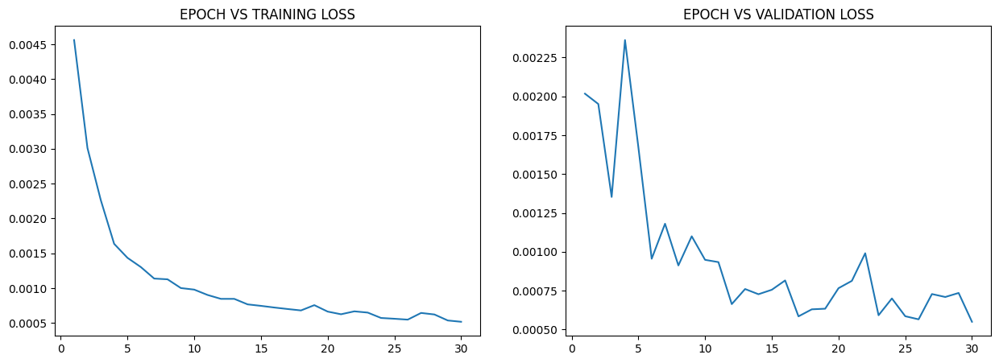

In [28]:
trainingloss=[0.00456151,0.00301220,0.00226368,0.00163642,0.00143566,0.00130347,0.00113828,0.00112756,0.00100192,0.00097961,0.00090283,0.00084695,0.00084695,0.00076784,0.00074647,0.00072267,0.00070111,0.00068075,0.00075659,0.00066423,0.00062586,0.00066774,0.00064995,0.00057259,0.00056138,0.00054863,0.00064472,0.00062268,0.00053672,0.00051800]
validationloss=[0.00201689,0.00195049,0.00135274,0.00236184,0.00167402,0.00095513,0.00118028,0.00091204,0.00109958,0.00094809,0.00093341,0.00066332,0.00076030,0.00072686,0.00075549,0.00081552,0.00058444,0.00062975,0.00063372,
0.00076564,0.00081287,0.00099048,0.00059159,0.00069974,0.00058535,0.00056535,0.00072802,0.00070908,0.00073499,0.00054965]
epoch=np.arange(1,31)
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(epoch,trainingloss)
plt.title("EPOCH VS TRAINING LOSS")
plt.subplot(1,2,2)
plt.plot(epoch,validationloss)
plt.title("EPOCH VS VALIDATION LOSS")
plt.show()